# Clustering with PCA
#### Author: Christian Berdejo Sánchez

Starting from the given dataset and the initial code provided for data loading, perform the following tasks:

Source: https://archive.ics.uci.edu/dataset/333/forest+type+mapping

1. Perform a PCA analysis to detect the most relevant components. Visualize the explained variances (CVRs) and decide the number of PCs to use (e.g., 3).

1. Using the transformed data, carry out a clustering analysis with several of the studied algorithms: K-Means, Hierarchical (Agglomerative) Clustering, and DBSCAN (add any necessary libraries).
1. Run different experiments with hyperparameters of the clustering algorithms to obtain optimized groupings.
1. Generate visualizations (e.g., scatter plots, heatmaps, etc.) of the results from PCA and clustering algorithms.
1. Include brief explanatory reasoning for the obtained results.


In [ ]:
# Install dependencies (only needed if not already installed)
!pip install numpy pandas scikit-learn matplotlib seaborn scipy


In [9]:

import numpy as np 
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
warnings.filterwarnings(action='ignore') 
%matplotlib inline

In [10]:
# Load data
df_train = pd.read_csv('../data/training.csv', header='infer')
df_test = pd.read_csv('../data/testing.csv', header='infer')
df = pd.concat([df_train, df_test], ignore_index=True)
df 

,class,b1,b2,b3,b4,b5,b6,b7,b8,b9,...,pred_minus_obs_H_b9,pred_minus_obs_S_b1,pred_minus_obs_S_b2,pred_minus_obs_S_b3,pred_minus_obs_S_b4,pred_minus_obs_S_b5,pred_minus_obs_S_b6,pred_minus_obs_S_b7,pred_minus_obs_S_b8,pred_minus_obs_S_b9
0,d,39,36,57,91,59,101,93,27,60,...,-2.36,-18.41,-1.88,-6.43,-21.03,-1.60,-6.18,-22.50,-5.20,-7.86
1,h,84,30,57,112,51,98,92,26,62,...,-2.26,-16.27,-1.95,-6.25,-18.79,-1.99,-6.18,-23.41,-8.87,-10.83
2,s,53,25,49,99,51,93,84,26,58,...,-1.46,-15.92,-1.79,-4.64,-17.73,-0.48,-4.69,-19.97,-4.10,-7.07
3,s,59,26,49,103,47,92,82,25,56,...,2.68,-13.77,-2.53,-6.34,-22.03,-2.34,-6.60,-27.10,-7.99,-10.81
4,d,57,49,66,103,64,106,114,28,59,...,-2.94,-21.74,-1.64,-4.62,-23.74,-0.85,-5.50,-22.83,-2.74,-5.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
518,o,55,56,72,91,79,113,86,35,68,...,-12.86,-23.08,-0.08,-3.46,-27.52,-1.04,-4.73,-22.85,-1.49,-4.10
519,d,69,49,76,91,52,91,92,25,57,...,-2.36,-11.47,-0.40,-3.74,-16.90,-0.78,-4.15,-11.13,-1.48,-3.55
520,s,49,26,48,107,59,104,62,22,53,...,2.32,-23.48,1.44,-1.59,-26.98,-1.36,-4.81,-24.50,-2.53,-4.97
521,s,55,26,52,92,55,98,65,23,56,...,-0.77,-23.74,1.27,-1.30,-25.53,-1.21,-4.70,-24.39,-2.21,-4.72


This dataset contains 523 samples with 27 variables and 4 classification classes.  For this study, we will ignore the provided labels and explore what we obtain using clustering techniques.

In [11]:
df_features =  df.drop(columns=['class'])
df_target = df['class']
df_features

,b1,b2,b3,b4,b5,b6,b7,b8,b9,pred_minus_obs_H_b1,...,pred_minus_obs_H_b9,pred_minus_obs_S_b1,pred_minus_obs_S_b2,pred_minus_obs_S_b3,pred_minus_obs_S_b4,pred_minus_obs_S_b5,pred_minus_obs_S_b6,pred_minus_obs_S_b7,pred_minus_obs_S_b8,pred_minus_obs_S_b9
0,39,36,57,91,59,101,93,27,60,75.70,...,-2.36,-18.41,-1.88,-6.43,-21.03,-1.60,-6.18,-22.50,-5.20,-7.86
1,84,30,57,112,51,98,92,26,62,30.58,...,-2.26,-16.27,-1.95,-6.25,-18.79,-1.99,-6.18,-23.41,-8.87,-10.83
2,53,25,49,99,51,93,84,26,58,63.20,...,-1.46,-15.92,-1.79,-4.64,-17.73,-0.48,-4.69,-19.97,-4.10,-7.07
3,59,26,49,103,47,92,82,25,56,55.54,...,2.68,-13.77,-2.53,-6.34,-22.03,-2.34,-6.60,-27.10,-7.99,-10.81
4,57,49,66,103,64,106,114,28,59,59.44,...,-2.94,-21.74,-1.64,-4.62,-23.74,-0.85,-5.50,-22.83,-2.74,-5.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
518,55,56,72,91,79,113,86,35,68,62.20,...,-12.86,-23.08,-0.08,-3.46,-27.52,-1.04,-4.73,-22.85,-1.49,-4.10
519,69,49,76,91,52,91,92,25,57,34.95,...,-2.36,-11.47,-0.40,-3.74,-16.90,-0.78,-4.15,-11.13,-1.48,-3.55
520,49,26,48,107,59,104,62,22,53,69.86,...,2.32,-23.48,1.44,-1.59,-26.98,-1.36,-4.81,-24.50,-2.53,-4.97
521,55,26,52,92,55,98,65,23,56,63.64,...,-0.77,-23.74,1.27,-1.30,-25.53,-1.21,-4.70,-24.39,-2.21,-4.72


Scale data using StandartScaler

In [12]:
standardized = StandardScaler()
standardized.fit(df_features)
scaled_data = standardized.transform(df_features)
X = scaled_data
X

array([[-1.6935747 , -0.21241105, -0.33311629, ..., -0.8598544 ,
        -2.58988486, -2.41191093],
       [ 1.95511447, -0.58941663, -0.33311629, ..., -1.07947761,
        -5.26897453, -4.36985379],
       [-0.55842695, -0.90358795, -0.83555268, ..., -0.24925363,
        -1.78688795, -1.89111131],
       ...,
       [-0.88275488, -0.84075369, -0.89835723, ..., -1.34254277,
        -0.64079237, -0.50670726],
       [-0.39626299, -0.84075369, -0.64713903, ..., -1.31599491,
        -0.40719327, -0.34189725],
       [ 0.90104871, -0.71508516, -0.70994358, ...,  1.49566481,
         0.21330434,  0.37667437]], shape=(523, 27))

## 1 - PCA

We reduce the dimensionality of the data to 3 principal components and visualize it using PCA.

In [13]:
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

In [14]:
X_pca.shape

(523, 3)

I declare some functions to plot the real labels that will be use to compare with the results we get 

In [47]:
def plot_real_3d_pca_with_labels(X_pca, df_target):
    fig = plt.figure(figsize=(15, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(X_pca[:,0], X_pca[:,1], X_pca[:,2], s=60, c=df_target.astype('category').cat.codes, cmap='viridis')
    legend1 = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend1)
    ax.set_title('3D PCA of Forest Types with Real Labels')
    ax.set_xlabel('First Principal Component')
    ax.set_ylabel('Second Principal Component')
    ax.set_zlabel('Third Principal Component')
    ax.view_init(20, 60)
    plt.show()
    

def plot_real_2d_pca_with_labels(X_pca, df_target, plot_type="all"):
    """
    Plot PCA components in 2D with real labels.
    
    Parameters:
    - X_pca: array with PCA-transformed data (at least 3 components).
    - df_target: labels for coloring the points.
    - plot_type: which plot to display.
        "12"  -> PC1 vs PC2
        "13"  -> PC1 vs PC3
        "23"  -> PC2 vs PC3
        "all" -> show all three plots (default).
    """
    def plot_scatter(x_idx, y_idx, x_label, y_label, title):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=X_pca[:, x_idx], y=X_pca[:, y_idx], hue=df_target, palette="Set1")
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.title(title)
        plt.legend(title="Classes")
        plt.show()
    
    if plot_type == "12" or plot_type == "all":
        plot_scatter(0, 1, "First Principal Component", "Second Principal Component",
                     "First vs Second Principal Component with Real Labels")
    if plot_type == "13" or plot_type == "all":
        plot_scatter(0, 2, "First Principal Component", "Third Principal Component",
                     "First vs Third Principal Component with Real Labels")
    if plot_type == "23" or plot_type == "all":
        plot_scatter(1, 2, "Second Principal Component", "Third Principal Component",
                     "Second vs Third Principal Component with Real Labels")


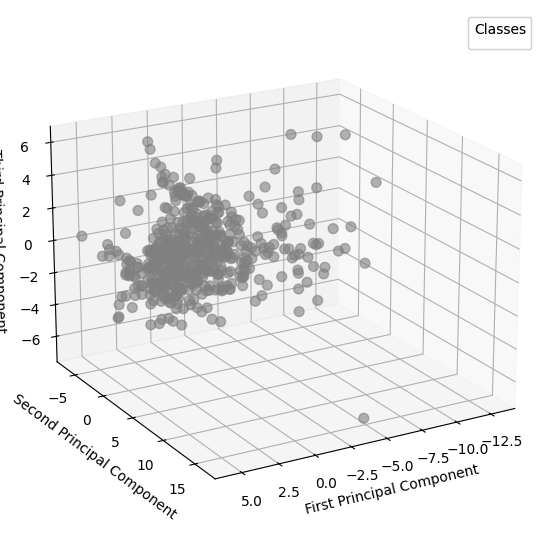

In [48]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(122, projection='3d')
scatter = ax.scatter(
    X_pca[:, 0], X_pca[:, 1], X_pca[:, 2],
    color="gray", s=50, alpha=0.6
)
legend1 = ax.legend(*scatter.legend_elements(), title="Classes")
ax.add_artist(legend1)
ax.set_xlabel('First Principal Component')
ax.set_ylabel('Second Principal Component')
ax.set_zlabel('Third Principal Component')
ax.view_init(20, 60)
plt.show()

As we can see, if we did not have the real labels, we would not be able to get a clear idea of the existing clusters. 

In addition to PCA we need to use clustering techniques, since plotting alone does not allow us to discriminate between labels. We will continue the clustering study in 3 dimensions. To visualize the dataset more conveniently, we will plot the first principal component against the second and third principal components, as well as the second against the third.

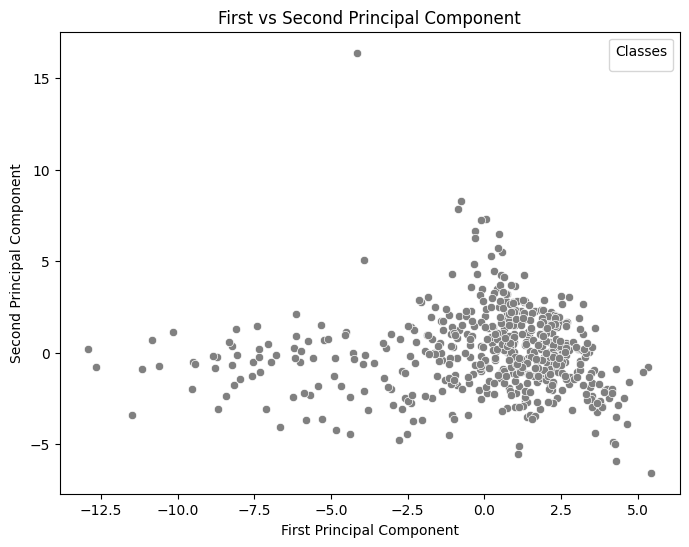

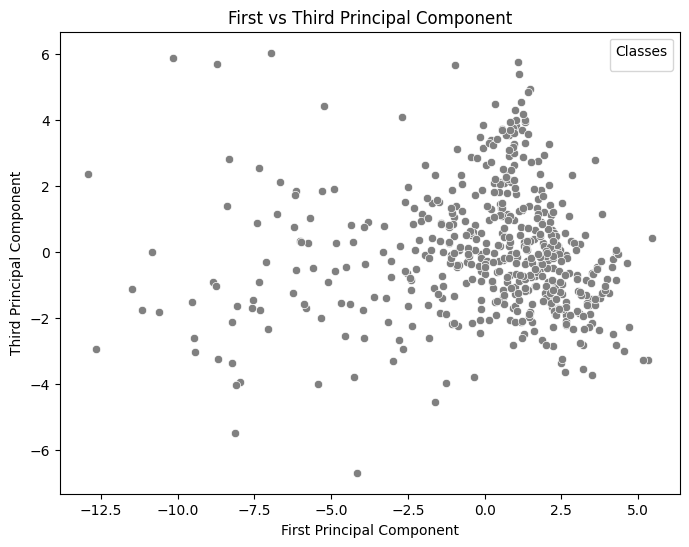

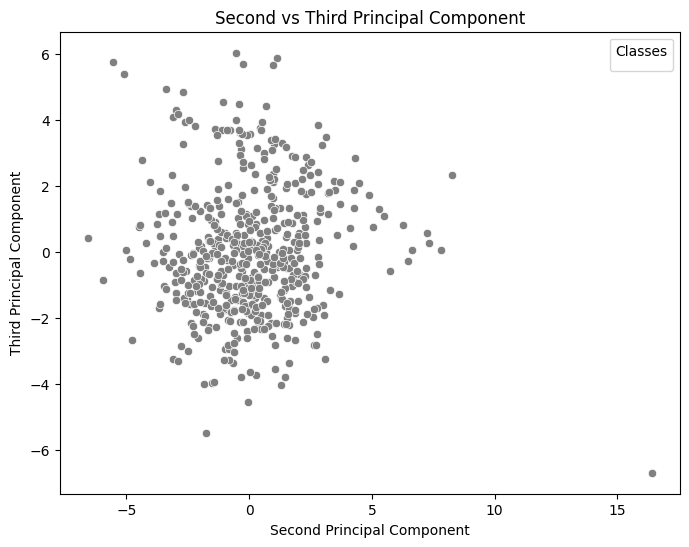

In [49]:
# First plot: First vs Second Principal Component
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], color="gray", palette='Set1')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('First vs Second Principal Component')
plt.legend(title='Classes')
plt.show()

# Second plot: First vs Third Principal Component
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 2], color="gray", palette='Set1')
plt.xlabel('First Principal Component')
plt.ylabel('Third Principal Component')
plt.title('First vs Third Principal Component')
plt.legend(title='Classes')
plt.show()

# Third plot: Second vs Third Principal Component
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 1], y=X_pca[:, 2], color="gray", palette='Set1')
plt.xlabel('Second Principal Component')
plt.ylabel('Third Principal Component')
plt.title('Second vs Third Principal Component')
plt.legend(title='Classes')
plt.show()

We could also visualize the importance of each variable in the principal components as follows:

In [50]:
df_pc = pd.DataFrame(pca.components_, columns = df_features.columns)

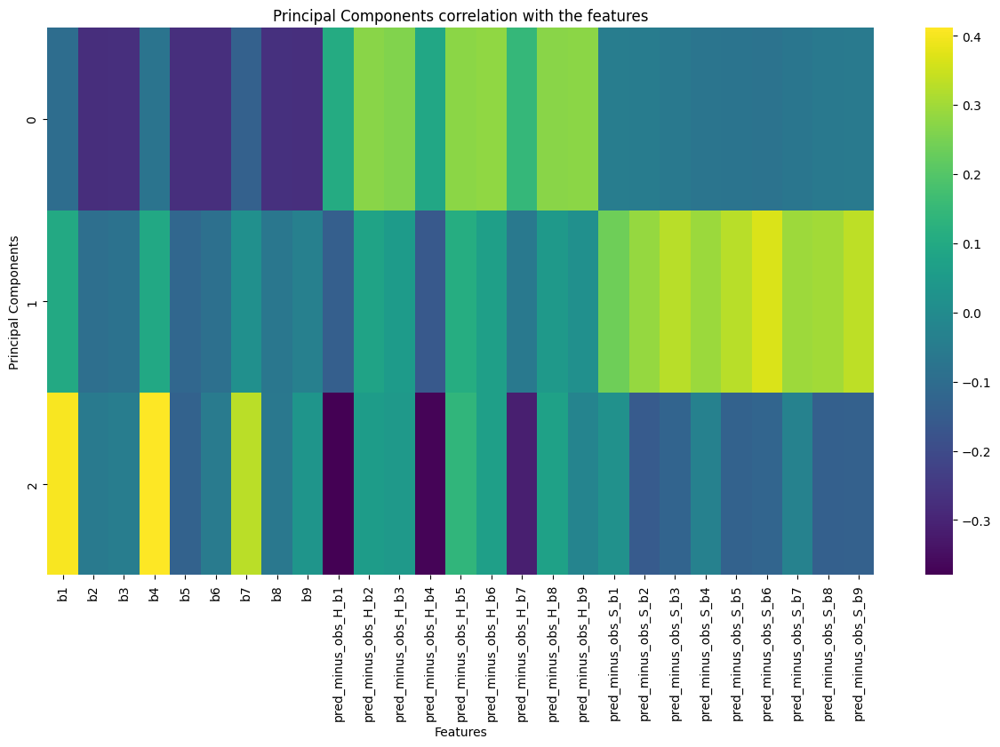

In [51]:
plt.figure(figsize=(15, 8))
sns.heatmap(df_pc, cmap='viridis')
plt.title('Principal Components correlation with the features')
plt.xlabel('Features')
plt.ylabel('Principal Components')
plt.show()

## 2 - Clustering


### K-Means

We use the elbow method to view the most appropiate number of clusters

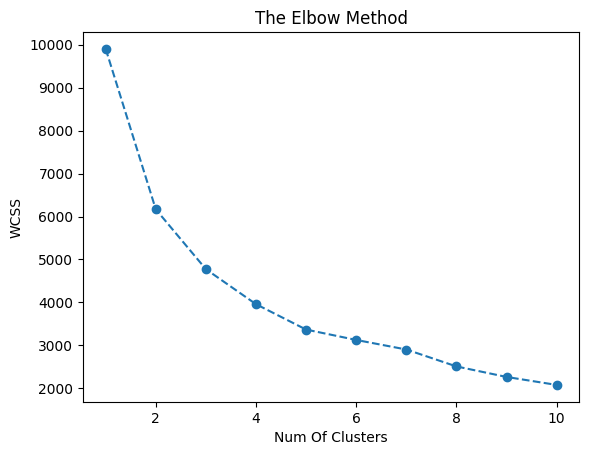

In [52]:

#Elbow method
WCSS =  [ ]
for i in range(1, 11):
    km = KMeans(n_clusters= i, init='k-means++', random_state=0)
    km.fit(X_pca)
    WCSS.append(km.inertia_)

plt.plot(range(1,11),WCSS, marker='o',linestyle='dashed')
plt.title('The Elbow Method')
plt.xlabel('Num Of Clusters')
plt.ylabel('WCSS')
plt.show()

It seems 4 is the appropiate number of clusters (which matches the real number of labels, its a good sign!)

In [53]:
clusterer = KMeans(n_clusters=4, random_state=10)
y_mean = clusterer.fit_predict(X)


We calculate the silhouette_score, and we could use it to make sure 4 is the appropriate number of clusters if we were not sure between 3 and 5, since the score helps us compare the overall compactness and separation of different clustering solutions.


In [54]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=4): {silhouette_score(X, y_mean)}')

Silhouette Score(n=4): 0.16354764986932016


Volvemos a plotear los datos con los clusters obtenidos.

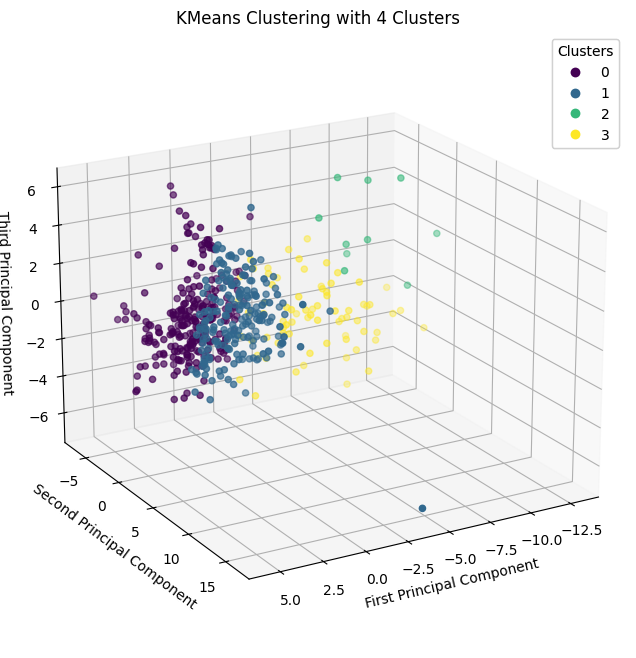

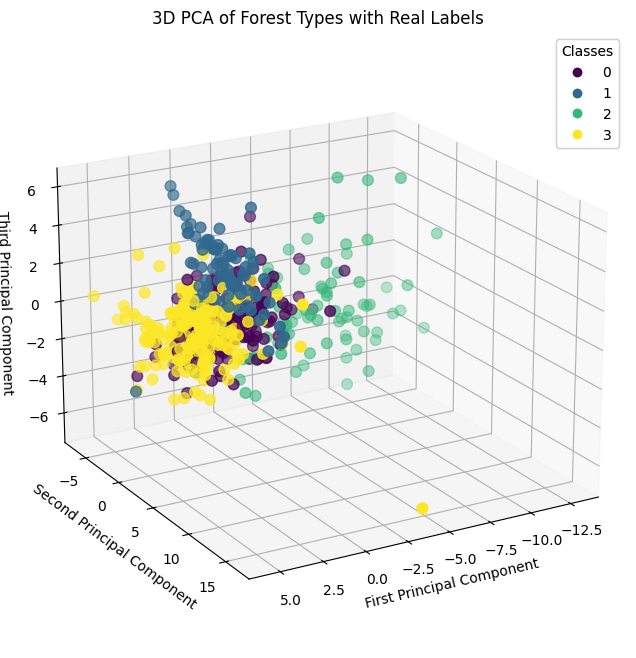

In [55]:
#plot
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=y_mean, cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)
ax.set_xlabel('First Principal Component')
ax.set_ylabel('Second Principal Component')
ax.set_zlabel('Third Principal Component')
ax.view_init(20, 60)
plt.title('KMeans Clustering with 4 Clusters')
plt.show()

plot_real_3d_pca_with_labels(X_pca, df_target)

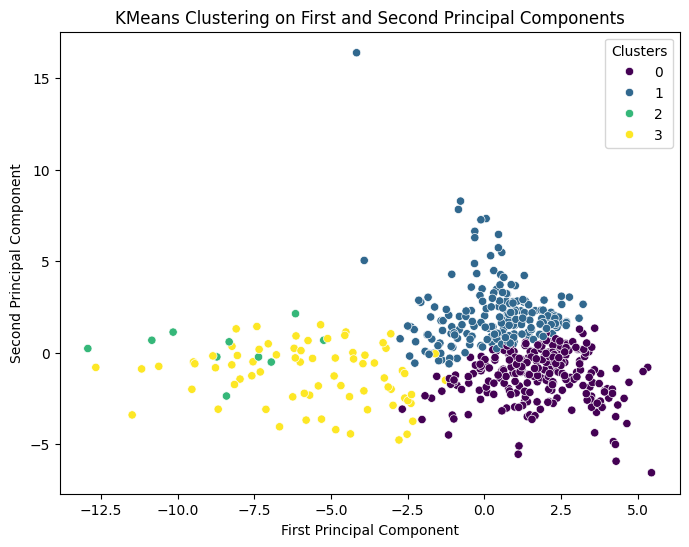

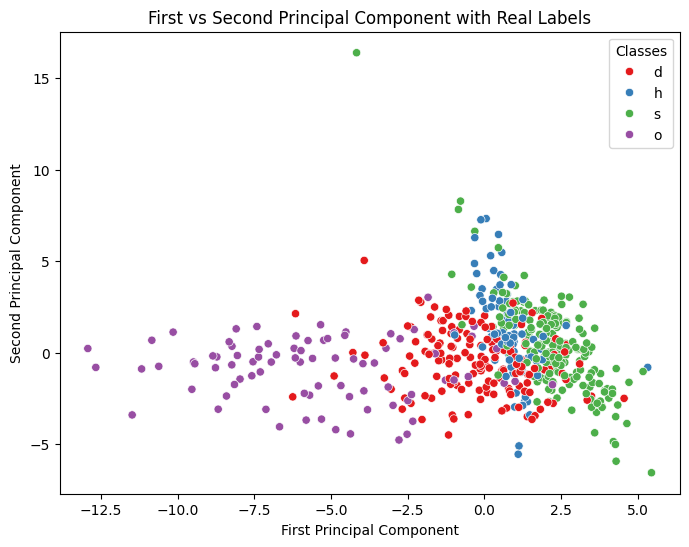

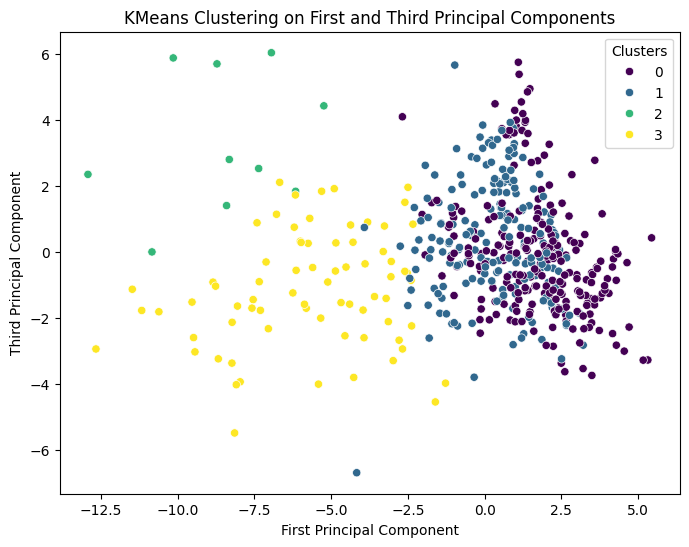

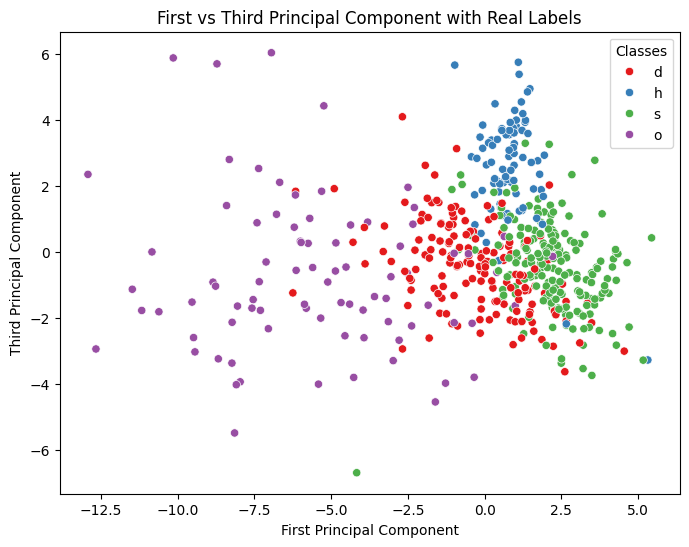

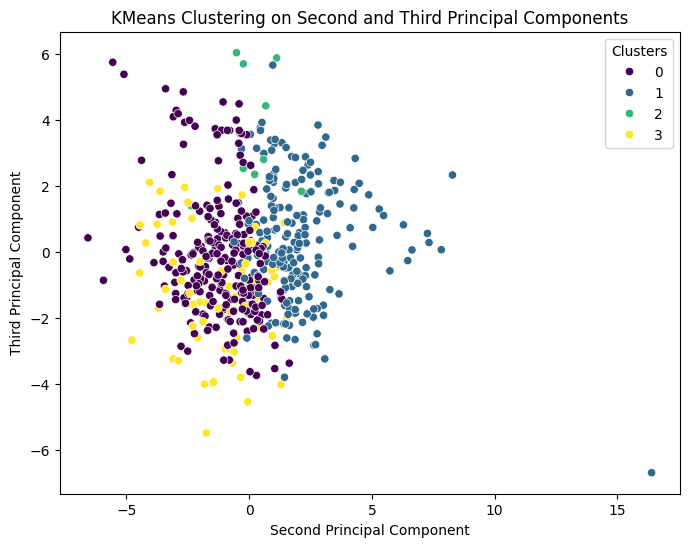

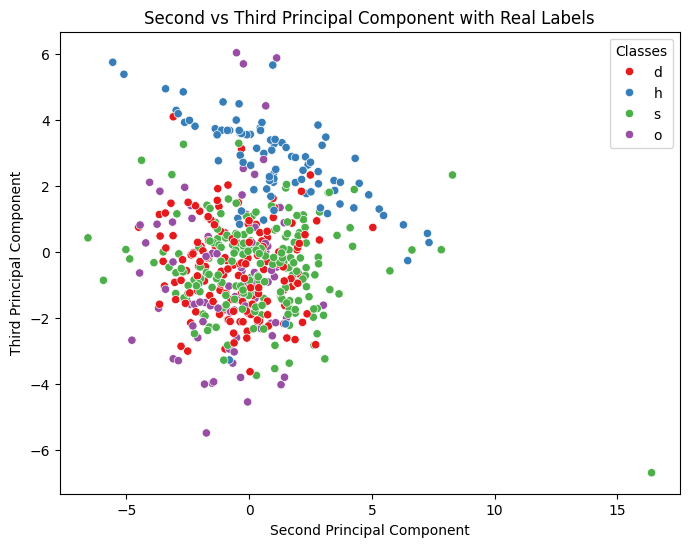

In [57]:
# First vs Second Principal Component
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=y_mean, palette='viridis')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('KMeans Clustering on First and Second Principal Components')
plt.legend(title='Clusters')                                                                                                                                                            
plt.show()

plot_real_2d_pca_with_labels(X_pca, df_target, plot_type="12")
# First vs Third Principal Component
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 2], hue=y_mean, palette='viridis')
plt.xlabel('First Principal Component')
plt.ylabel('Third Principal Component')
plt.title('KMeans Clustering on First and Third Principal Components')
plt.legend(title='Clusters')
plt.show()
plot_real_2d_pca_with_labels(X_pca, df_target, plot_type="13")

# Second vs Third Principal Component
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 1], y=X_pca[:, 2], hue=y_mean, palette='viridis')
plt.xlabel('Second Principal Component')
plt.ylabel('Third Principal Component')
plt.title('KMeans Clustering on Second and Third Principal Components')
plt.legend(title='Clusters')
plt.show()
plot_real_2d_pca_with_labels(X_pca, df_target, plot_type="23")




### Conclusion: K-Means vs Real Labels

When comparing the clusters obtained with **K-Means** to the **real class labels**, several insights emerge:

- **Partial alignment**:  
  Some groups identified by K-Means overlap with the real classes, suggesting that PCA combined with clustering can capture part of the underlying structure in the data.

- **Misalignment and overlap**:  
  There is no perfect match between clusters and true labels. Many samples from different real classes fall into the same cluster, showing that the separation in the reduced PCA space is not sufficient to fully discriminate all categories.

- **Cluster shapes**:  
  K-Means assumes spherical, equally sized clusters, which may not reflect the true distribution of the data. This explains why boundaries often cut across actual classes.

- **Utility of clustering**:  
  Even if K-Means does not recover the real labels exactly, it is still useful for **exploratory analysis**, detecting **hidden structures**, and providing an **unsupervised view** of the dataset.





### DBSCAN

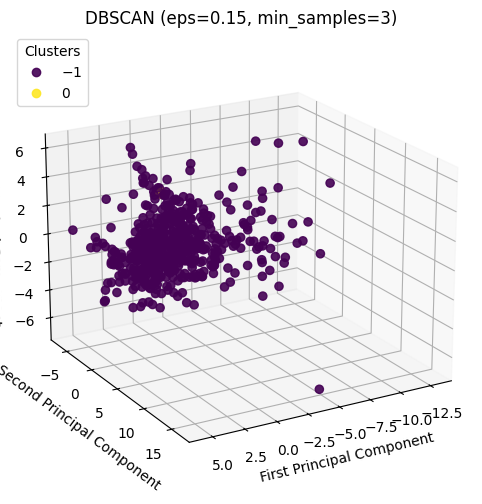

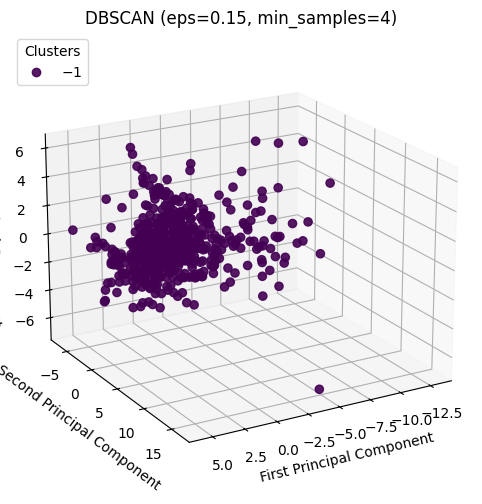

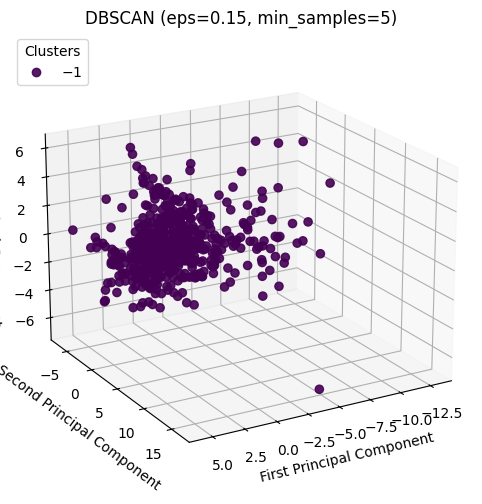

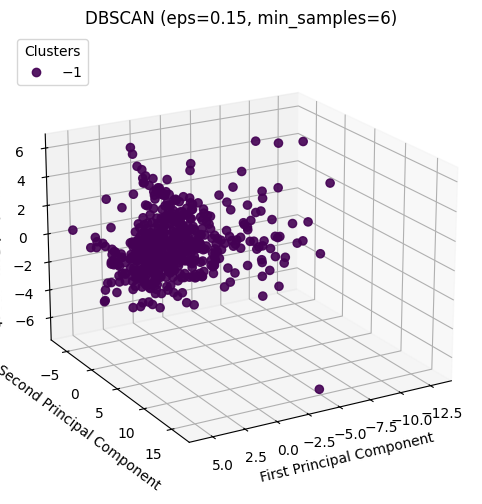

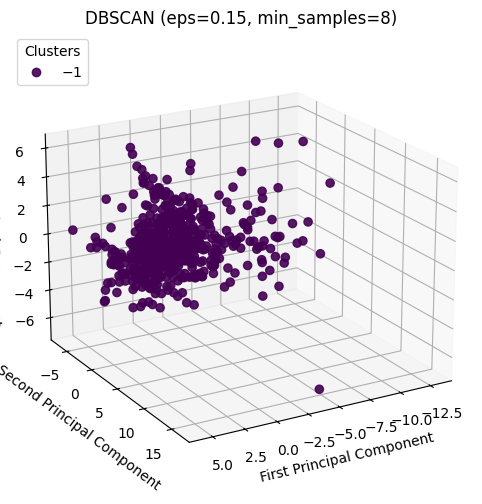

...

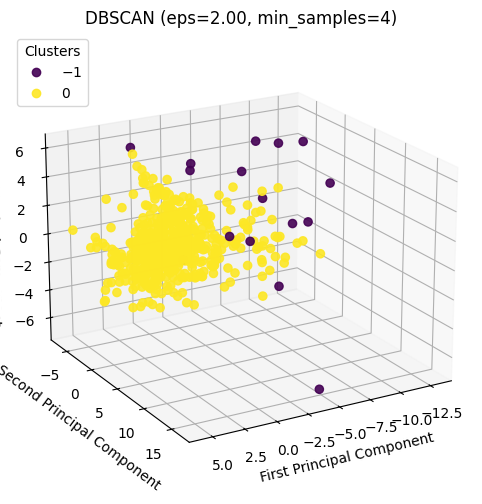

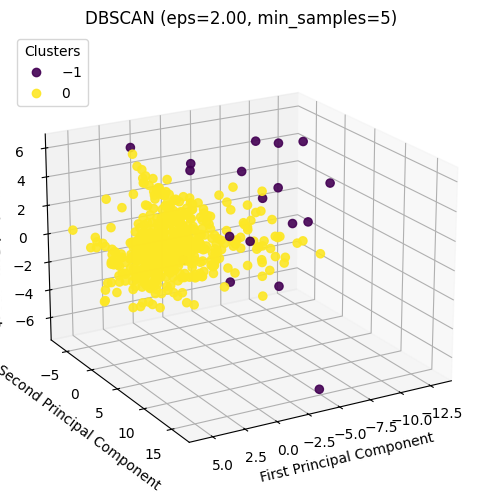

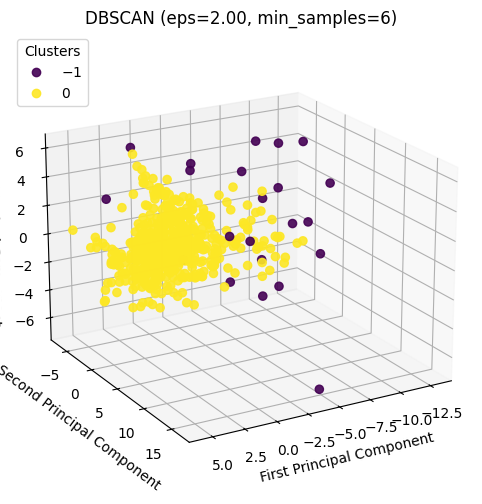

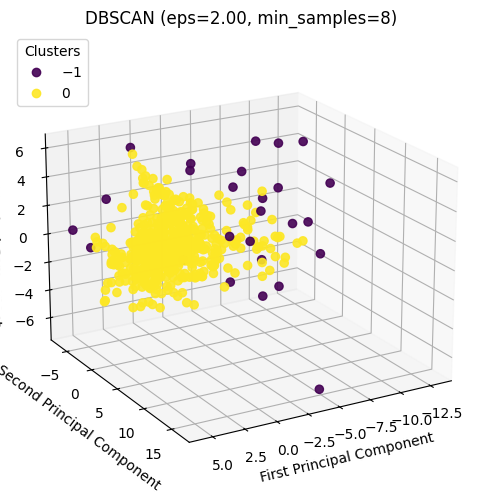

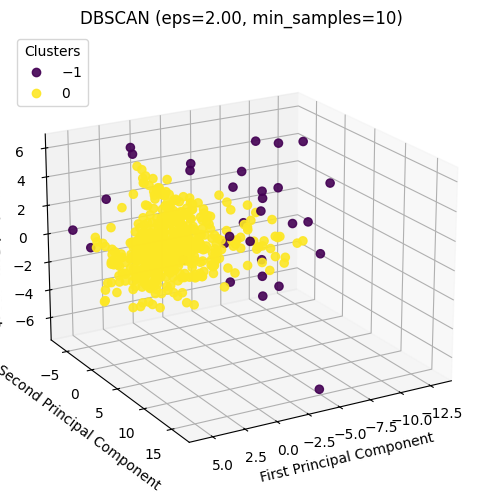

In [59]:


eps_list = [0.15, 0.25, 0.35, 0.5, 0.7, 1.0, 1.4, 2.0]
min_samples_list = [3, 4, 5, 6, 8, 10]

for eps in eps_list:
    for min_samples in min_samples_list:
        # Fit on the same space you plot (here we use X_pca)
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric="euclidean")
        cluster_labels = dbscan.fit_predict(X_pca)

        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(111, projection='3d')
        scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2],
                             c=cluster_labels, cmap='viridis', s=35, alpha=0.9)
        # Legend (skips noise if present)
        handles, labels = scatter.legend_elements()
        ax.legend(handles, labels, title="Clusters", loc="upper left")
        ax.set_xlabel('First Principal Component')
        ax.set_ylabel('Second Principal Component')
        ax.set_zlabel('Third Principal Component')
        ax.view_init(20, 60)
        plt.title(f'DBSCAN (eps={eps:.2f}, min_samples={min_samples})')
        plt.show()



In this dataset, DBSCAN is not effective because the distribution of points after PCA projection does not show clear dense regions separated by low-density areas. Instead, most points are concentrated in a central cloud with gradual transitions and overlaps. DBSCAN relies on identifying clusters as areas of high density surrounded by sparse regions, but here the density is relatively uniform and continuous.

As a result, DBSCAN either classifies almost everything into a single cluster or labels many points as noise.

The absence of well-defined “density valleys” between clusters makes it impossible for DBSCAN to separate groups meaningfully.

This is a typical limitation of DBSCAN when data has overlapping classes, variable densities, or lacks distinct boundaries.

Conclusion: In this case, clustering methods such as K-Means or Agglomerative Clustering (Ward linkage) are more appropriate, since they do not depend strictly on density gaps but instead partition the space based on variance or distance.Para este tipo de distribución de datos, el método DBSCAN es poco efectivo, ya que no es muy capaz de separar en clusters

### Agglomerative Clustering

Probamos a hacer clustering jerárquico con diferentes métodos de enlace (ward, complete, average, single). Visualizamos el resultado y el dendograma para cada uno de ellos.

Linkage: ward


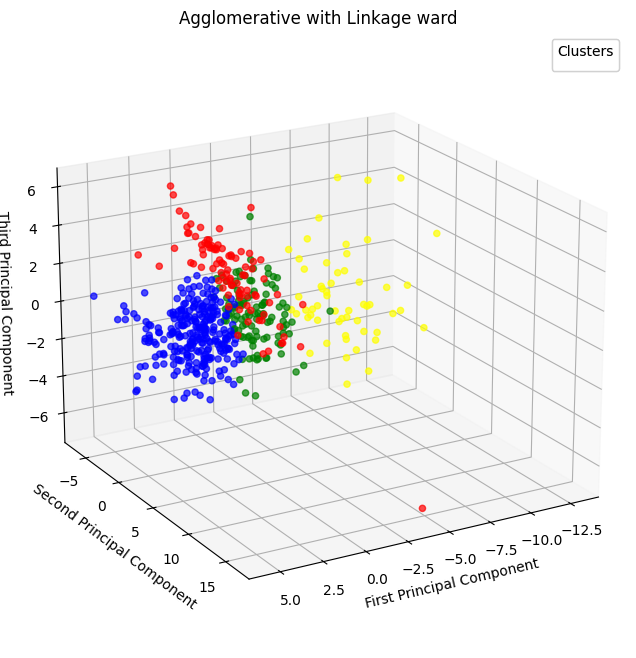

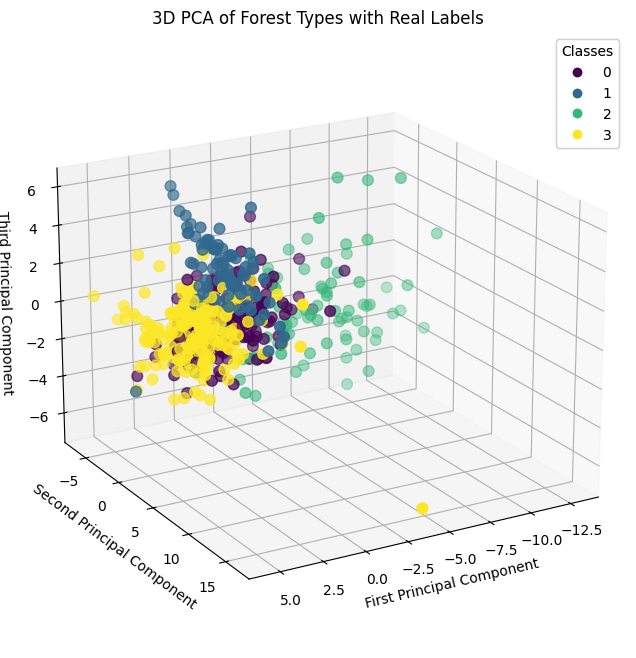

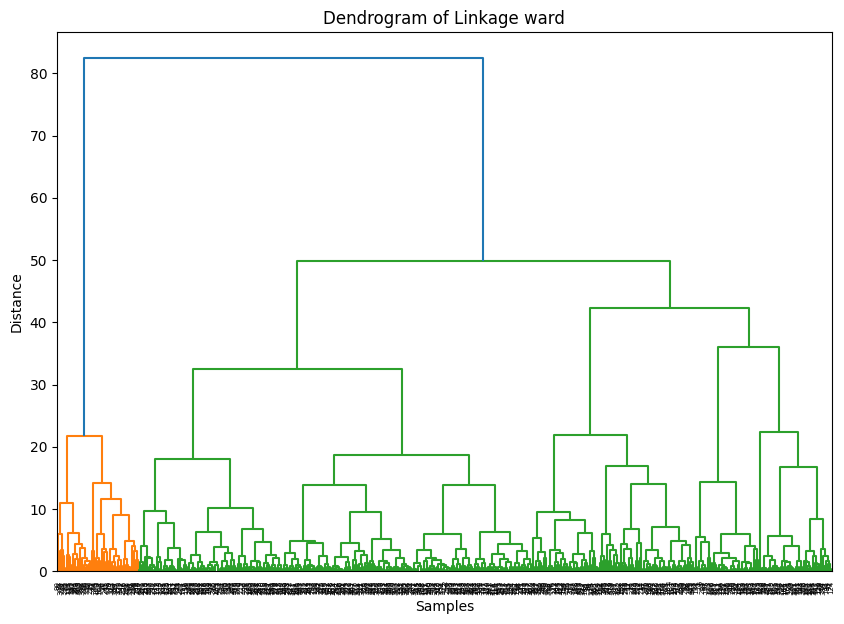

Linkage: single


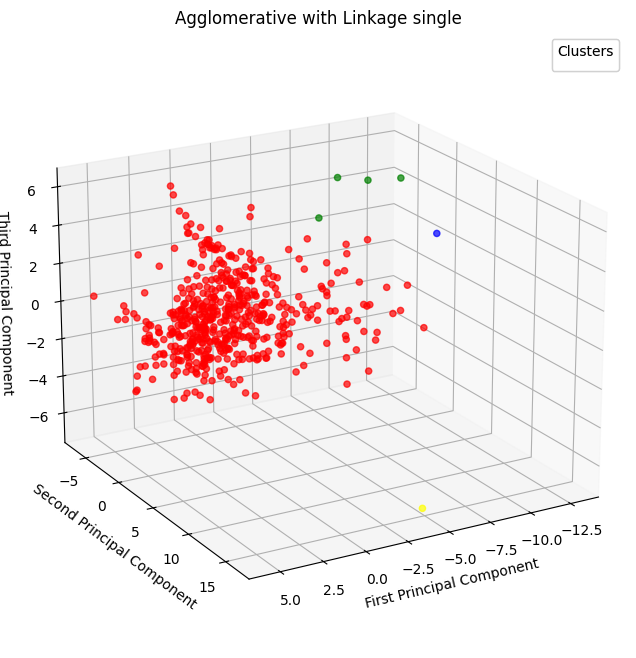

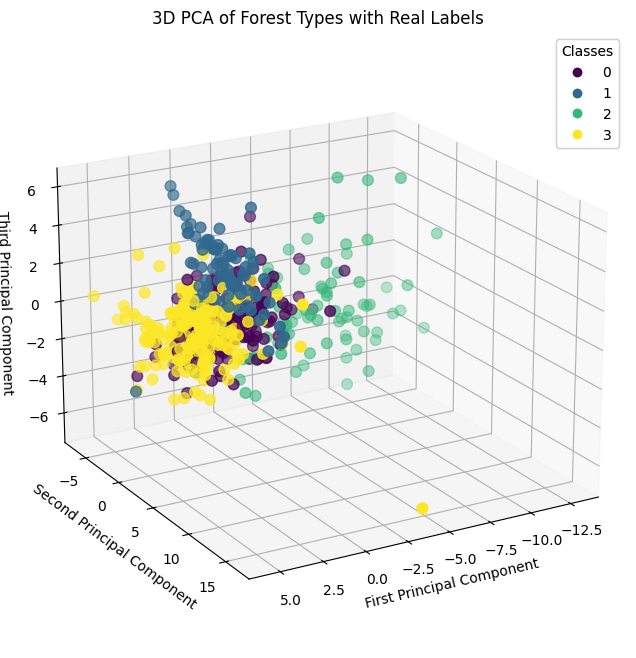

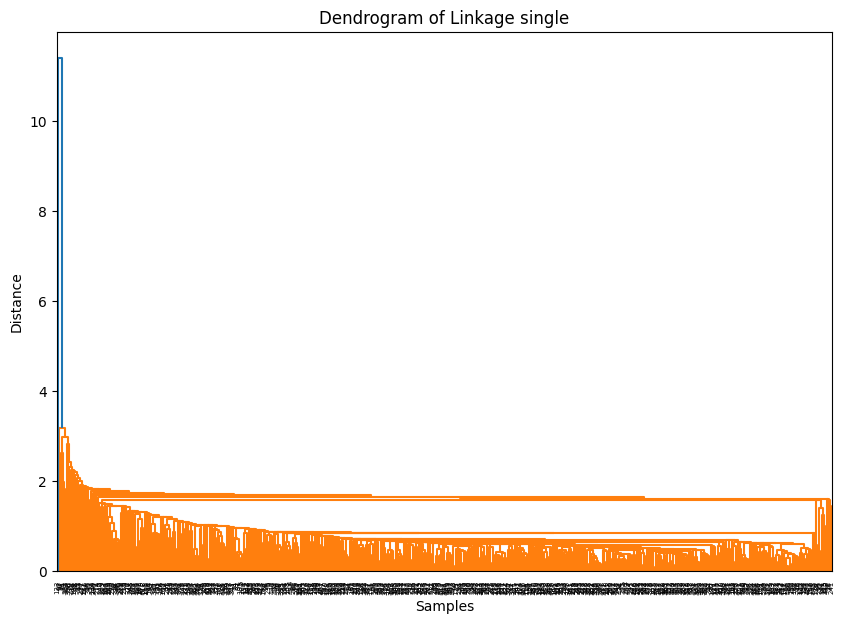

Linkage: complete


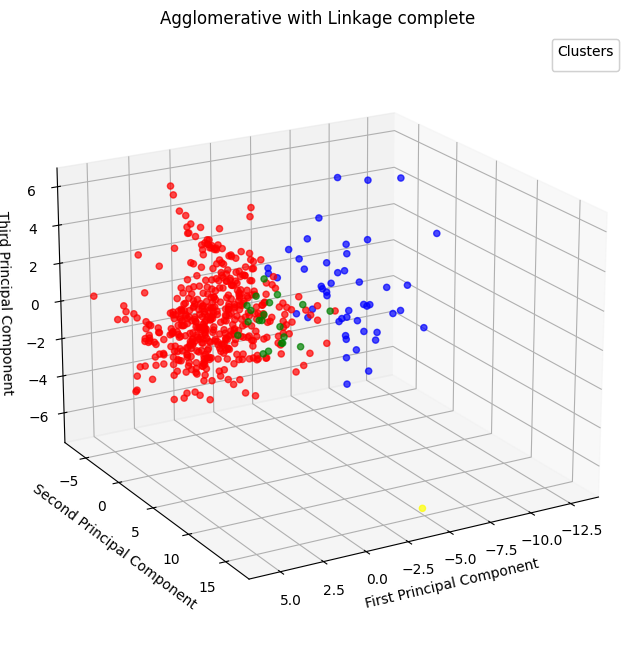

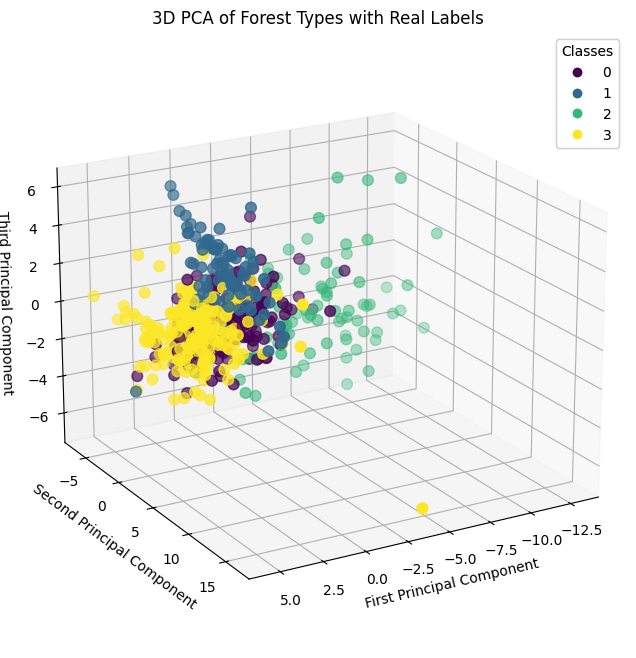

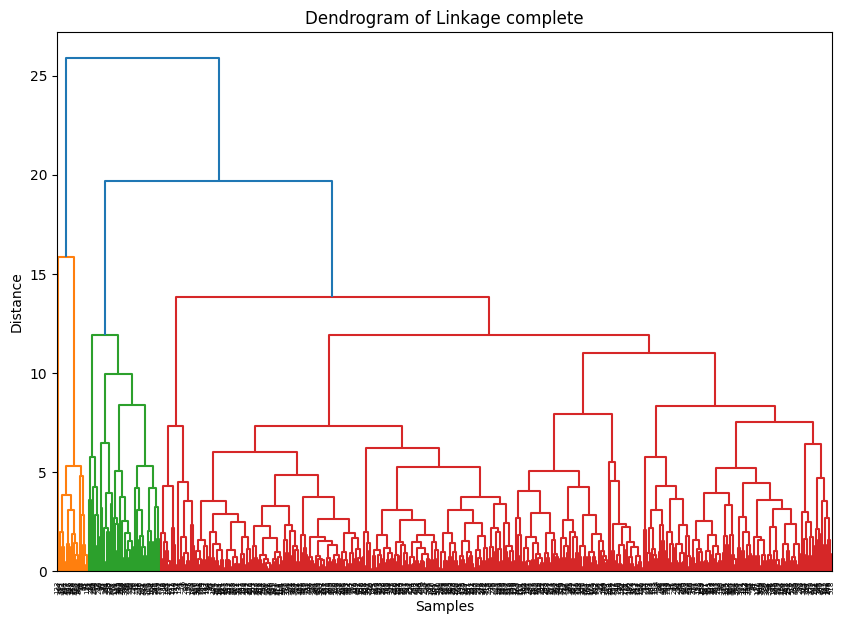

Linkage: average


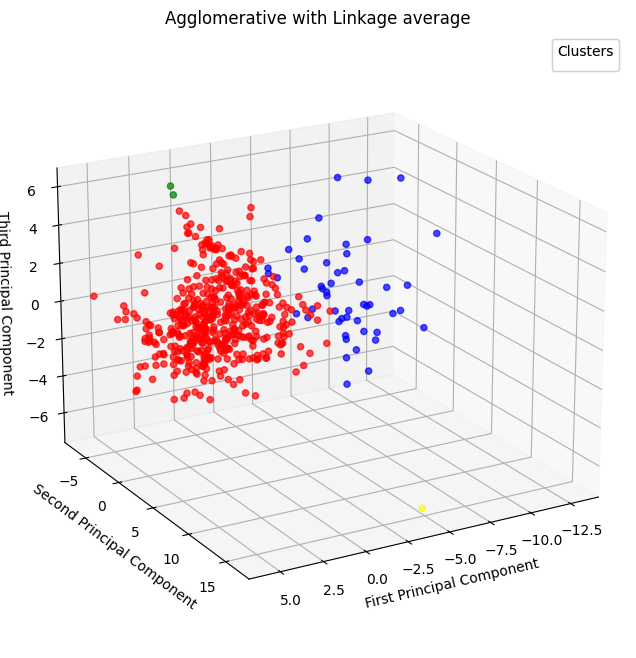

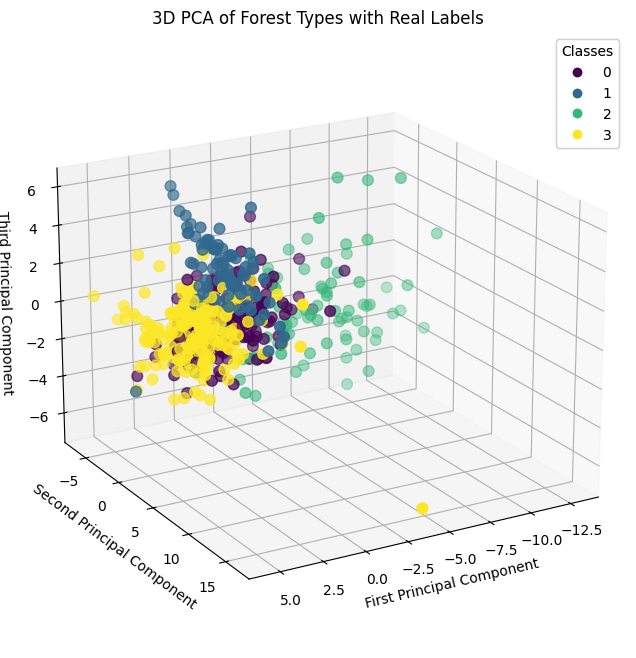

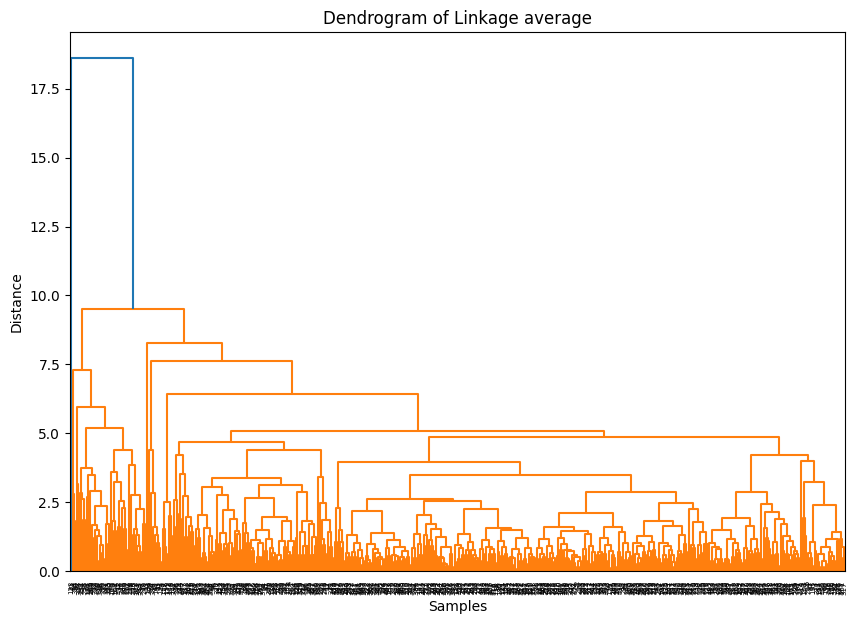

In [60]:
from scipy.cluster.hierarchy import dendrogram, linkage

linkages = ['ward', 'single', 'complete', 'average']

for link in linkages:
    agglo = AgglomerativeClustering(n_clusters=4, linkage=link)
    agglo.fit(X_pca)
    myColors = {0: 'red', 1: 'green', 2: 'blue', 3: 'yellow',} 

    print(f"Linkage: {link}")

    fig = plt.figure(figsize=(15, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=pd.Series(agglo.labels_).apply(lambda x: myColors[x]), alpha=0.7)
    legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
    ax.add_artist(legend1)
    ax.set_xlabel('First Principal Component')
    ax.set_ylabel('Second Principal Component')
    ax.set_zlabel('Third Principal Component')
    ax.view_init(20, 60)
    plt.title(f'Agglomerative with Linkage {link}')
    plt.show()
    plot_real_3d_pca_with_labels(X_pca, df_target)
    # Generate the linkage matrix
    Z = linkage(X_pca, link)

    # Plot the dendrogram
    plt.figure(figsize=(10, 7))
    dendrogram(Z)
    plt.title(f'Dendrogram of Linkage {link}')
    plt.xlabel('Samples')
    plt.ylabel('Distance')
    plt.show()

Observations from the Agglomerative Clustering Results

**1. Ward linkage**

- The 3D scatter plot with Ward shows well-separated and compact clusters that align reasonably well with the real classes.
- Ward minimizes within-cluster variance, so it works similarly to K-Means but in a hierarchical setting.
- The dendrogram of Ward displays clear jumps in distance when clusters are merged. This suggests a natural cutoff point (number of clusters) that makes sense with the dataset.

**2. Single linkage**

- The scatter plot with single linkage shows almost everything merged into one large cluster with a few scattered points.
- This is the “chaining effect”: single linkage tends to connect points via nearest neighbors, creating long, loose clusters.
- The dendrogram confirms this: merges happen very early, distances between clusters remain small, and separation is weak.

**3. Complete linkage**

- The complete linkage result shows some separation, but clusters are not as compact or meaningful compared to Ward.
- The dendrogram reveals more gradual merges without a clear strong jump, making the optimal cutoff less obvious.

**4. Average linkage**

- Similar to complete linkage: produces intermediate results, but clusters still overlap.
- The dendrogram shows smoother merges, again without sharp separation like Ward.- 

### Conclusion

- Ward linkage performs best here because it balances compactness and separation, producing clusters that match the structure of the real labels more closely.
- The dendrogram from Ward clearly indicates a natural number of clusters (around 4), supporting the ground-truth classes.